In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import numpy as np
import seaborn as sns

In [2]:
adata_file = "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/adata_with_ercc_genecode_counts_for_gatk_with_metadata.h5ad"

#Results Files
tms_mt_3m= "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/tms_mt_3m.h5ad"
tms_mt_18m= "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/tms_mt_18m.h5ad"
tms_mt_21m= "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/tms_mt_21m.h5ad"
tms_mt_24m= "/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/adata_files/tms_mt_24m.h5ad"


In [3]:
adata = sc.read_h5ad(adata_file)

In [4]:
sc.settings.verbosity = 3             
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.20.1 scipy==1.6.2 pandas==1.2.4 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.8 pynndescent==0.5.5


**.obs.index** for cells

**.var.index** for genes

In [ ]:
adata.var.index 

In [ ]:
adata.obs.index

In [6]:
#checking if the file has mt- genes

def mt_gene_check(adata_object):
    '''Takes an AnnData object. Returns genes that begin with mt- and their index in adata.var.index list'''
    
    gene_list = list(adata_object.var.index)
    for gene in gene_list:
        if 'mt-' == gene[:3]:
            print(gene, list(adata.var.index).index(gene))

In [7]:
mt_gene_check(adata)

mt-Atp6 54224
mt-Atp8 54225
mt-Co1 54226
mt-Co2 54227
mt-Co3 54228
mt-Cytb 54229
mt-Nd1 54230
mt-Nd2 54231
mt-Nd3 54232
mt-Nd4 54233
mt-Nd4l 54234
mt-Nd5 54235
mt-Nd6 54236
mt-Rnr1 54237
mt-Rnr2 54238
mt-Ta 54239
mt-Tc 54240
mt-Td 54241
mt-Te 54242
mt-Tf 54243
mt-Tg 54244
mt-Th 54245
mt-Ti 54246
mt-Tk 54247
mt-Tl1 54248
mt-Tl2 54249
mt-Tm 54250
mt-Tn 54251
mt-Tp 54252
mt-Tq 54253
mt-Tr 54254
mt-Ts1 54255
mt-Ts2 54256
mt-Tt 54257
mt-Tv 54258
mt-Tw 54259
mt-Ty 54260


In [ ]:
adata.n_obs #cells

In [ ]:
adata.n_vars #genes

In [ ]:
adata.obs['tissue']

In [8]:
adata.obs['age'] #cell x gene

index
A1.D041912.3_8_M.1.1-1-1-0-0-0       3m
A1.D041914.3_8_M.1.1-1-1-0-0-0       3m
A1.MAA000400.3_8_M.1.1-1-1-0-0-0     3m
A1.MAA000510.3_8_M.1.1-1-1-0-0-0     3m
A1.MAA000531.3_8_M.1.1-1-1-0-0-0     3m
                                   ... 
P9_B000485_S69.mus-2-1-1-0          18m
P9_B000492_S153.mus-2-1-1-0         18m
P9_B000956_S237.mus-2-1-1-0         21m
P9_MAA001690_S21.mus-2-1-1-0        21m
P9_MAA001700_S105.mus-2-1-1-0       21m
Name: age, Length: 161216, dtype: category
Categories (4, object): ['3m', '18m', '21m', '24m']

In [ ]:
#adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

PREPROCESSING

In [ ]:
#adata. X, rows correspond to observations (i.e., cells) and columns correspond to features (i.e., genes)
adata.X

In [9]:
def ERCC_gene_check(adata_object):
    '''Takes an AnnData object. Returns tally of ERCC genes. Option to print genes that begin with ERCC-'''
    ERCC_tally = 0
    gene_list = list(adata_object.var.index)
    for gene in gene_list:
        if 'ERCC-' == gene[:5]:
            ERCC_tally += 1
            #print(gene)
    print("ERCC gene total:", ERCC_tally)

In [10]:
ERCC_gene_check(adata)

ERCC gene total: 92


In [11]:
ERCC_genes = []
gene_list = list(adata.var.index)
for gene in gene_list:
    if 'ERCC-' == gene[:5]:
        ERCC_genes.append(gene)
len(ERCC_genes)

92

In [12]:
filtered_genes = []
gene_list = list(adata.var.index)
for gene in gene_list:
    if 'ERCC-' != gene[:5]:
        filtered_genes.append(gene)
len(filtered_genes)

54352

In [13]:
(len(adata.var.index)) - (len(filtered_genes))

92

In [34]:
#Removes ERCC- genes from adata object
adata_no_ERCC = adata[:, filtered_genes]

ERCC_gene_check(adata_no_ERCC)

ERCC gene total: 0


Filter by .obvs['ages'] 


Categories (4, object): ['3m', '18m', '21m', '24m']


Single dimensional annotations of the observation and variables are stored in the obs and var attributes as DataFrames. This is intended for metrics calculated over their axes. Multi-dimensional annotations are stored in obsm and varm, which are aligned to the objects observation and variable dimensions respectively. Square matrices representing graphs are stored in obsp and varp, with both of their own dimensions aligned to their associated axis. Additional measurements across both observations and variables are stored in layers.

Indexing into an AnnData object can be performed by relative position with numeric indices (like pandas’ iloc()), or by labels (like loc()). To avoid ambiguity with numeric indexing into observations or variables, indexes of the AnnData object are converted to strings by the constructor.

Subsetting an AnnData object by indexing into it will also subset its elements according to the dimensions they were aligned to. This means an operation like adata[list_of_obs, :] will also subset obs, obsm, and layers.

Subsetting an AnnData object returns a view into the original object, meaning very little additional memory is used upon subsetting. This is achieved lazily, meaning that the constituent arrays are subset on access. Copying a view causes an equivalent “real” AnnData object to be generated. Attempting to modify a view (at any attribute except X) is handled in a copy-on-modify manner, meaning the object is initialized in place. Here’s an example:

In [15]:
#adata.obs['age']
adata_no_ERCC.obs['age']

index
A1.D041912.3_8_M.1.1-1-1-0-0-0       3m
A1.D041914.3_8_M.1.1-1-1-0-0-0       3m
A1.MAA000400.3_8_M.1.1-1-1-0-0-0     3m
A1.MAA000510.3_8_M.1.1-1-1-0-0-0     3m
A1.MAA000531.3_8_M.1.1-1-1-0-0-0     3m
                                   ... 
P9_B000485_S69.mus-2-1-1-0          18m
P9_B000492_S153.mus-2-1-1-0         18m
P9_B000956_S237.mus-2-1-1-0         21m
P9_MAA001690_S21.mus-2-1-1-0        21m
P9_MAA001700_S105.mus-2-1-1-0       21m
Name: age, Length: 161216, dtype: category
Categories (4, object): ['3m', '18m', '21m', '24m']

In [35]:
#Subsetting by age

adata_no_ERCC_3m = adata_no_ERCC[adata_no_ERCC.obs['age'] == '3m']

adata_no_ERCC_18m = adata_no_ERCC[adata_no_ERCC.obs['age'] == '18m']

adata_no_ERCC_21m = adata_no_ERCC[adata_no_ERCC.obs['age'] == '21m']

adata_no_ERCC_24m = adata_no_ERCC[adata_no_ERCC.obs['age'] == '24m']

In [36]:
ERCC_gene_check(adata_no_ERCC_3m)

ERCC gene total: 0


**3 MONTH ANALYSIS**

/mnt/ibm_sm/home/lea.mcgeever/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


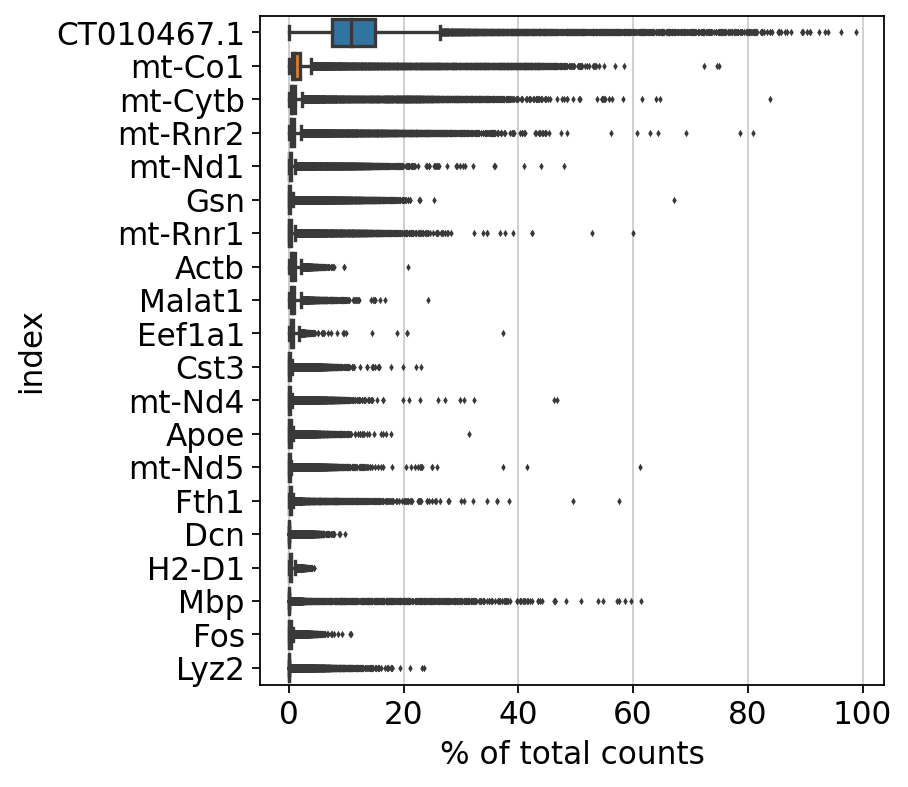

In [37]:
sc.pl.highest_expr_genes(adata_no_ERCC_3m, n_top=20, )
#mt_gene_check(adata_no_ERCC)

Basic Filtering

In [38]:
sc.pp.filter_cells(adata_no_ERCC_3m, min_genes=250)
#sc.pp.filter_genes(adata, min_cells=3) #don't do this step, a constant loop keeps removing loop

mt_gene_check(adata_no_ERCC_3m)

filtered out 8679 cells that have less than 250 genes expressed
mt-Atp6 54224
mt-Atp8 54225
mt-Co1 54226
mt-Co2 54227
mt-Co3 54228
mt-Cytb 54229
mt-Nd1 54230
mt-Nd2 54231
mt-Nd3 54232
mt-Nd4 54233
mt-Nd4l 54234
mt-Nd5 54235
mt-Nd6 54236
mt-Rnr1 54237
mt-Rnr2 54238
mt-Ta 54239
mt-Tc 54240
mt-Td 54241
mt-Te 54242
mt-Tf 54243
mt-Tg 54244
mt-Th 54245
mt-Ti 54246
mt-Tk 54247
mt-Tl1 54248
mt-Tl2 54249
mt-Tm 54250
mt-Tn 54251
mt-Tp 54252
mt-Tq 54253
mt-Tr 54254
mt-Ts1 54255
mt-Ts2 54256
mt-Tt 54257
mt-Tv 54258
mt-Tw 54259
mt-Ty 54260


In [39]:
adata_no_ERCC_3m.var['mt'] = adata_no_ERCC_3m.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata_no_ERCC_3m, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
#mt_gene_check(adata_no_ERCC)

A violin plot of some of the computed quality measures:

    -the number of genes expressed in the count matrix
    -the total counts per cell
    -the percentage of counts in mitochondrial genes


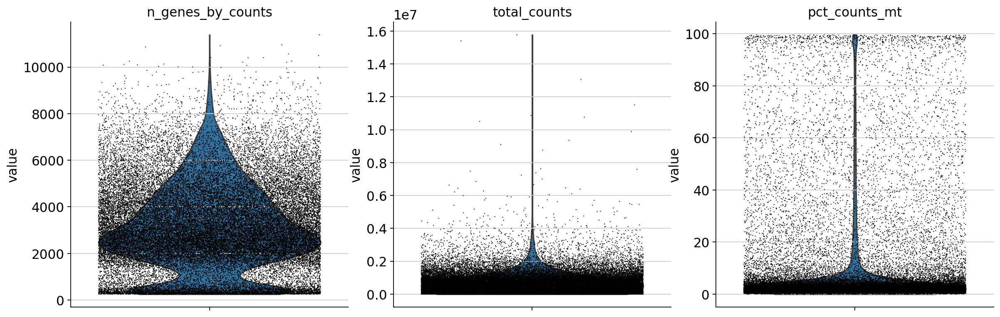

In [40]:
sc.pl.violin(adata_no_ERCC_3m, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

Won't be remove cells that have too many mitochondrial genes expressed, but will be removing too many total counts:

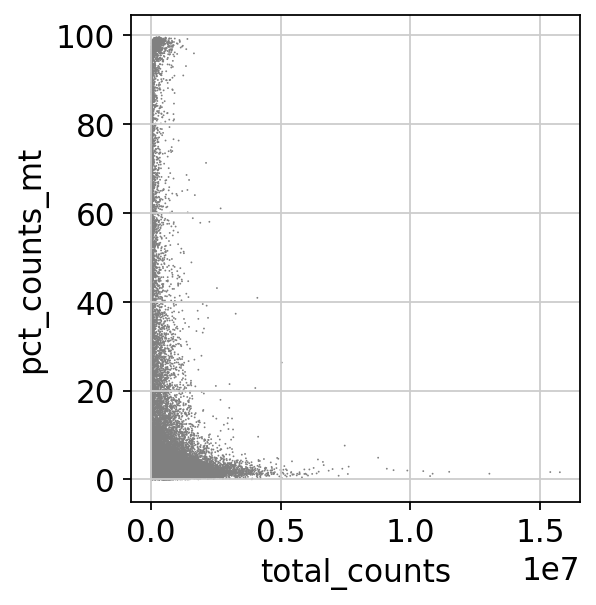

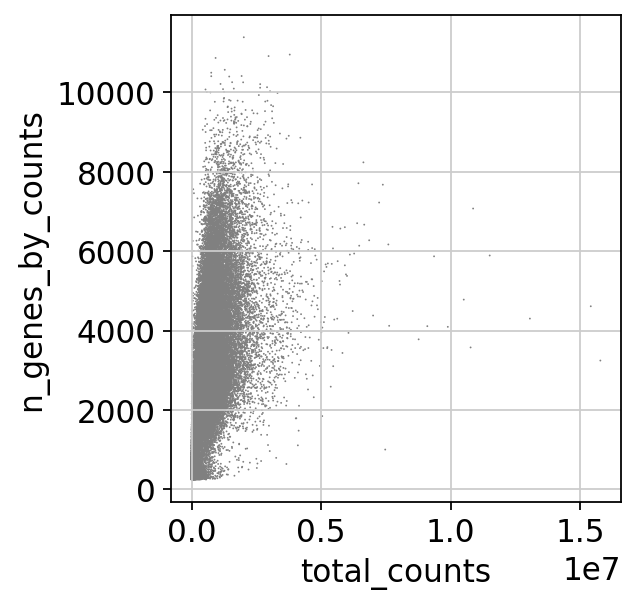

mt-Atp6 54224
mt-Atp8 54225
mt-Co1 54226
mt-Co2 54227
mt-Co3 54228
mt-Cytb 54229
mt-Nd1 54230
mt-Nd2 54231
mt-Nd3 54232
mt-Nd4 54233
mt-Nd4l 54234
mt-Nd5 54235
mt-Nd6 54236
mt-Rnr1 54237
mt-Rnr2 54238
mt-Ta 54239
mt-Tc 54240
mt-Td 54241
mt-Te 54242
mt-Tf 54243
mt-Tg 54244
mt-Th 54245
mt-Ti 54246
mt-Tk 54247
mt-Tl1 54248
mt-Tl2 54249
mt-Tm 54250
mt-Tn 54251
mt-Tp 54252
mt-Tq 54253
mt-Tr 54254
mt-Ts1 54255
mt-Ts2 54256
mt-Tt 54257
mt-Tv 54258
mt-Tw 54259
mt-Ty 54260


In [41]:
sc.pl.scatter(adata_no_ERCC_3m, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata_no_ERCC_3m, x='total_counts', y='n_genes_by_counts')
mt_gene_check(adata_no_ERCC_3m)

Actually do the filtering by slicing the AnnData object.

In [42]:
adata_no_ERCC_3m = adata_no_ERCC_3m[adata_no_ERCC_3m.obs.n_genes_by_counts < 2500, :] 
#less than 2500, number of genes detected per cell?

Total-count normalize (library-size correct) the data matrix 𝐗 to 10,000 reads per cell, so that counts become comparable among cells.

In [43]:
#Using data without ERCC- genes
sc.pp.normalize_total(adata_no_ERCC_3m, target_sum=1e4)

/mnt/ibm_sm/home/lea.mcgeever/anaconda3/lib/python3.8/site-packages/scanpy/preprocessing/_normalization.py:155: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


Logarithmize the data:

In [44]:
sc.pp.log1p(adata_no_ERCC_3m)
#mt_gene_check(adata_no_ERCC_3m)

Identify highly-variable genes.

In [45]:
sc.pp.highly_variable_genes(adata_no_ERCC_3m, min_mean=0.0125, max_mean=3, min_disp=0.5)
#mt_gene_check(adata)

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


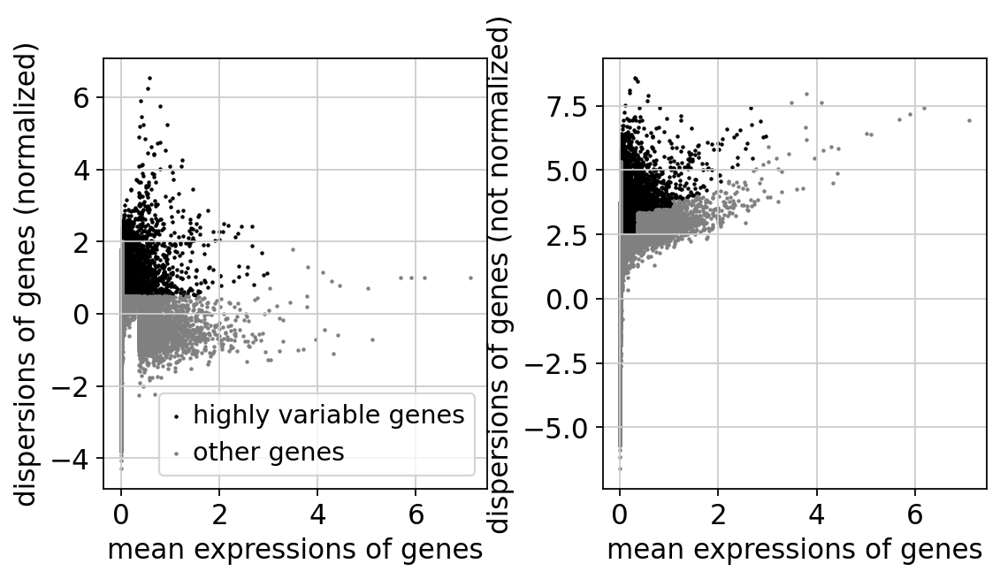

In [47]:
sc.pl.highly_variable_genes(adata_no_ERCC_3m)
#mt_gene_check(adata_no_ERCC_3m)

Set the .raw attribute of the AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

You can get back an AnnData of the object in .raw by calling .raw.to_adata().

In [48]:
adata_no_ERCC_3m.raw = adata_no_ERCC_3m

NOTE:
If you don’t proceed below with correcting the data with sc.pp.regress_out and scaling it via sc.pp.scale, you can also get away without using .raw at all.

The result of the previous highly-variable-genes detection is stored as an annotation in .var.highly_variable and auto-detected by PCA and hence, sc.pp.neighbors and subsequent manifold/graph tools. In that case, the step actually do the filtering below is unnecessary, too.

In [ ]:
#adata = adata[:, adata.var.highly_variable]
#Filters out all mt genes except mt-Atp8 and mt-Nd3
#don't do this

Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [49]:
sc.pp.scale(adata_no_ERCC_3m, max_value=10)
#optional, makes visuals slightly pretier

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


**Principal component analysis**

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [50]:
sc.tl.pca(adata_no_ERCC_3m, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:06)


We can make a scatter plot in the PCA coordinates, but we will not use that later on.

In [52]:
mt_genes = [
    "mt-Atp6",
    "mt-Atp8",
    "mt-Co1",
    "mt-Co2",
    "mt-Co3",
    "mt-Cytb",
    "mt-Nd1",
    "mt-Nd2",
    "mt-Nd3",
    "mt-Nd4",
    "mt-Nd4l",
    "mt-Nd5",
    "mt-Nd6",
    "mt-Rnr1",
    "mt-Rnr2",
    "mt-Ta",
    "mt-Te",
    "mt-Tf",
    "mt-Ti",
    "mt-Tl1",
#     "mt-Tl2",
    "mt-Tm",
    "mt-Tp",
    "mt-Tq",
    "mt-Tt",
    "mt-Tv"
]

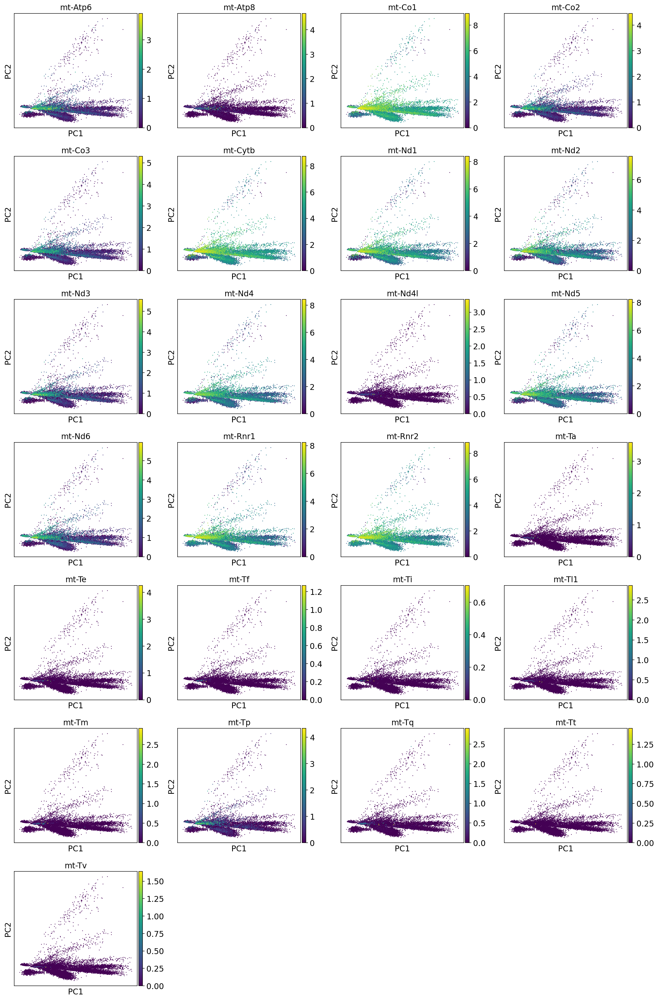

In [55]:
sc.pl.pca(adata_no_ERCC_3m, color=mt_genes)

Let us inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or tSNE sc.tl.tsne(). In our experience, often a rough estimate of the number of PCs does fine.

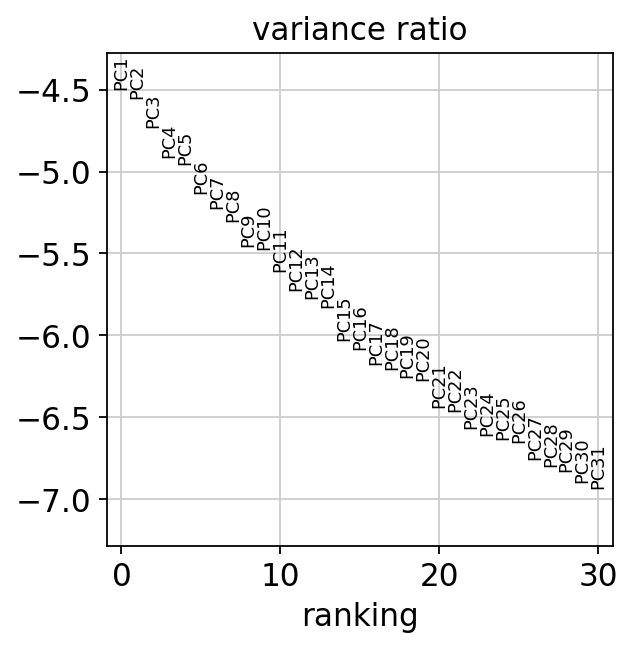

In [57]:
sc.pl.pca_variance_ratio(adata_no_ERCC_3m, log=True)

Save the result.

In [60]:
adata_no_ERCC_3m.write(results_file_mito)

**Computing the neighborhood graph**

Let us compute the neighborhood graph of cells using the PCA representation of the data matrix. You might simply use default values here. For the sake of reproducing Seurat’s results, let’s take the following values.

In [61]:
sc.pp.neighbors(adata_no_ERCC_3m, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:16)


**Embedding the neighborhood graph**

We suggest embedding the graph in two dimensions using UMAP (McInnes et al., 2018), see below. It is potentially more faithful to the global connectivity of the manifold than tSNE, i.e., it better preserves trajectories. In some ocassions, you might still observe disconnected clusters and similar connectivity violations. They can usually be remedied by running:

In [62]:
sc.tl.leiden(adata_no_ERCC_3m)

#sc.tl.paga(adata)
#sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
#don't need to compute papa, for higher order groups. umap better here
sc.tl.umap(adata_no_ERCC_3m)#, init_pos='paga')

running Leiden clustering
    finished: found 41 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


In [ ]:
# sc.tl.umap(adata) Would this need to be run again?

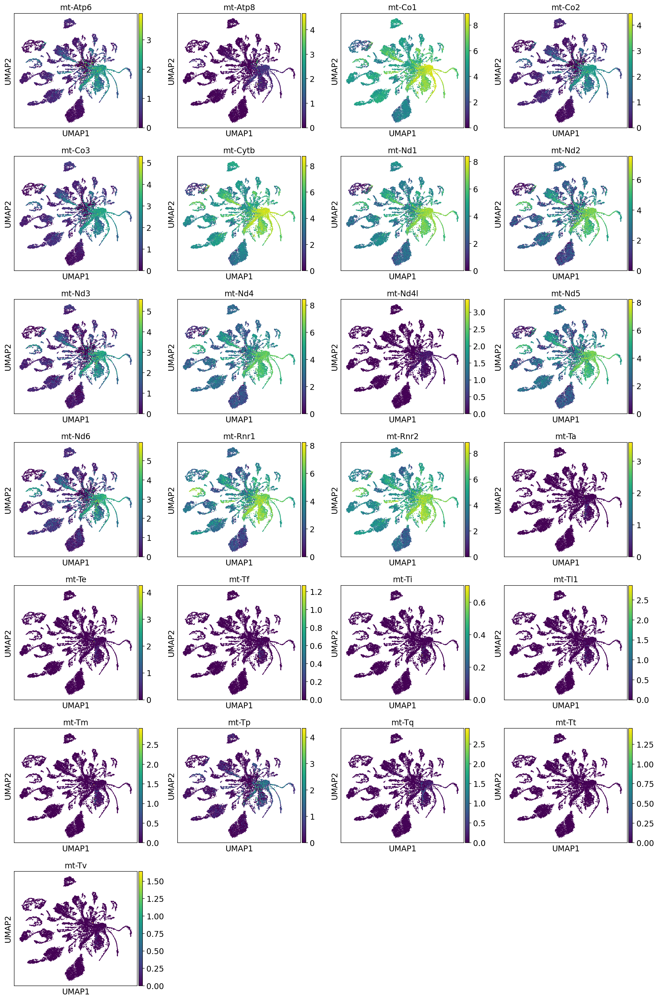

In [63]:
sc.pl.umap(adata_no_ERCC_3m, color=mt_genes)

As we set the .raw attribute of adata, the previous plots showed the “raw” (normalized, logarithmized, but uncorrected) gene expression. You can also plot the scaled and corrected gene expression by explicitly stating that you don’t want to use .raw.

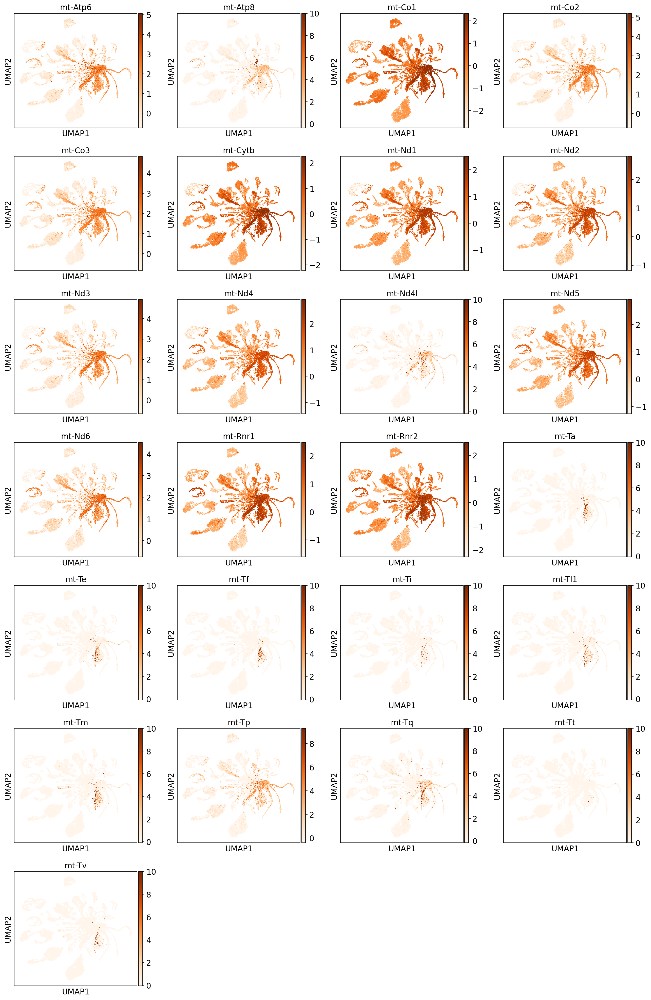

In [64]:
sc.pl.umap(adata_no_ERCC_3m, color= mt_genes, use_raw=False, cmap = "Oranges")

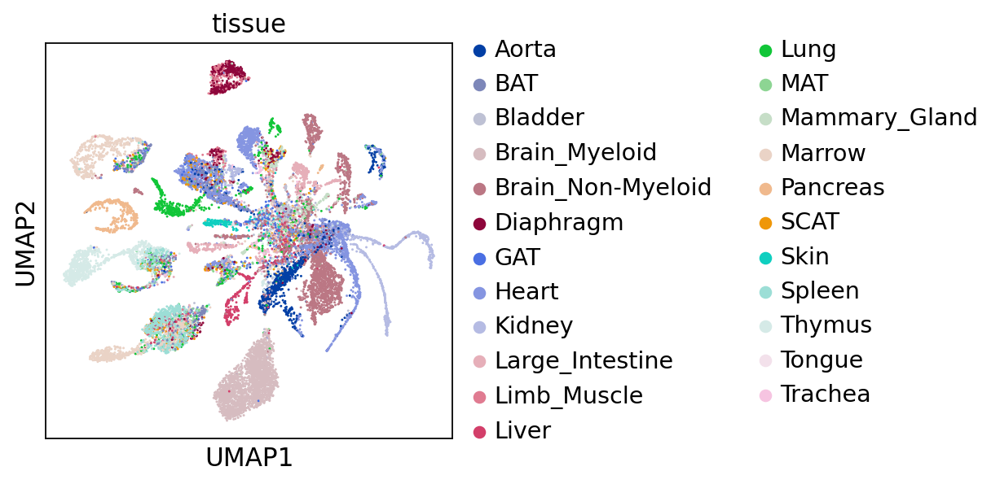

In [123]:
sc.pl.umap(adata_no_ERCC_3m, color= 'kidney', use_raw=False, cmap = "Oranges")

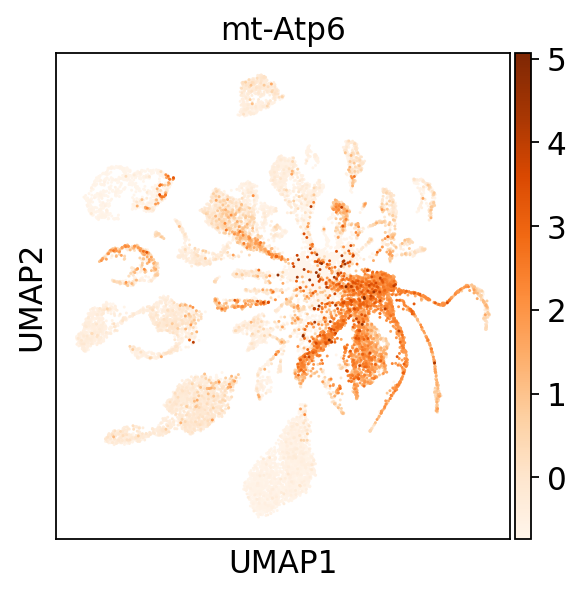

In [124]:
sc.pl.umap(adata_no_ERCC_3m, color= 'mt-Atp6', use_raw=False, cmap = "Oranges")

**Clustering the neighborhood graph**

As with Seurat and many other frameworks, we recommend the Leiden graph-clustering method (community detection based on optimizing modularity) by Traag *et al.* (2018). Note that Leiden clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

Plot the clusters, which agree quite well with the result of Seurat.

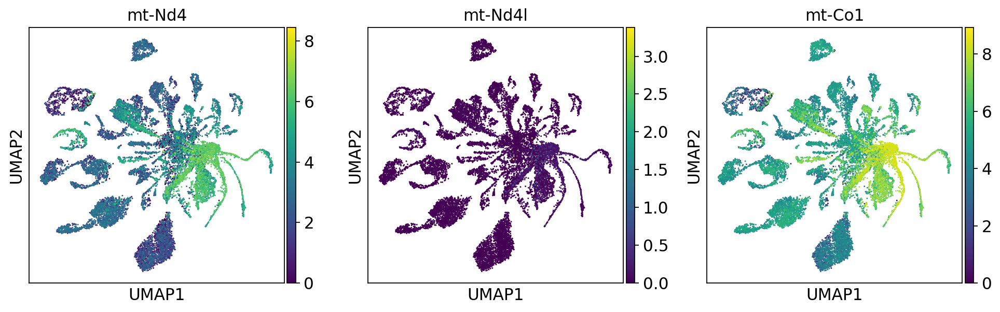

In [65]:
sc.pl.umap(adata_no_ERCC_3m, color=['mt-Nd4', 'mt-Nd4l', 'mt-Co1'])

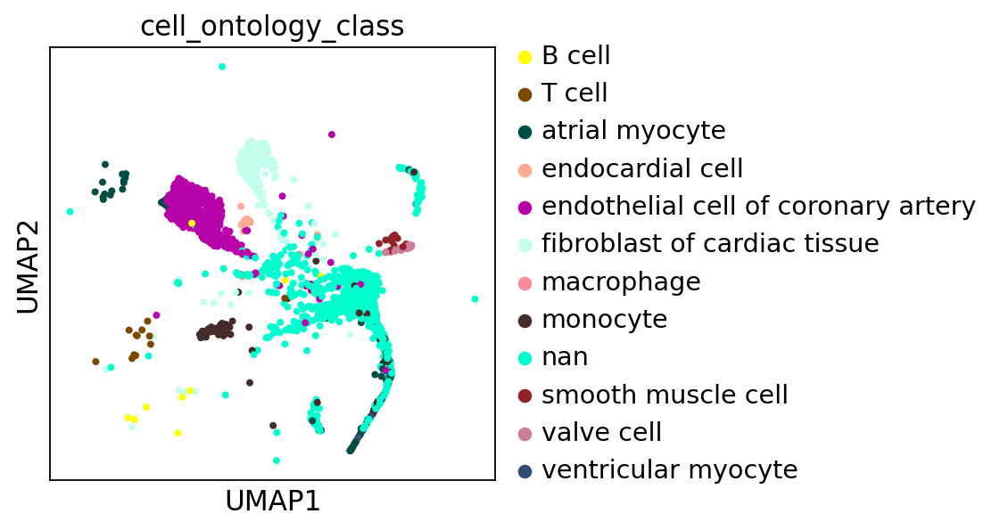

In [125]:
heart = adata_no_ERCC_3m[adata_no_ERCC_3m.obs["tissue"] == "Heart"]
sc.pl.umap(heart, color='cell_ontology_class')

In [129]:
adata_no_ERCC_3m.obs['tissue']

[index
 A10.MAA000554.3_8_M.1.1-1-1-0-0-0                  GAT
 A11.D041912.3_8_M.1.1-1-1-0-0-0                 Marrow
 A12.MAA000554.3_8_M.1.1-1-1-0-0-0                  GAT
 A13.D041912.3_8_M.1.1-1-1-0-0-0                 Marrow
 A15.D042193.3_8_M.1.1-1-1-0-0-0                 Marrow
                                            ...        
 P9.MAA000898.3_11_M.1.1-1-1-0-0-0                Heart
 P9.MAA000906.3_11_M.1.1-1-1-0-0-0                Aorta
 P9.MAA001888.3_39_F.1.1-1-1-0-0-0               Marrow
 P9.MAA001892.3_38_F.1.1-1-1-0-0-0                 Lung
 P9.MAA001894.3_39_F.1.1-1-1-0-0-0    Brain_Non-Myeloid
 Name: tissue, Length: 17456, dtype: category
 Categories (23, object): ['Aorta', 'BAT', 'Bladder', 'Brain_Myeloid', ..., 'Spleen', 'Thymus', 'Tongue', 'Trachea']]

In [66]:
adata_no_ERCC_3m.write(results_file_mito)

**Finding marker genes**

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:10)


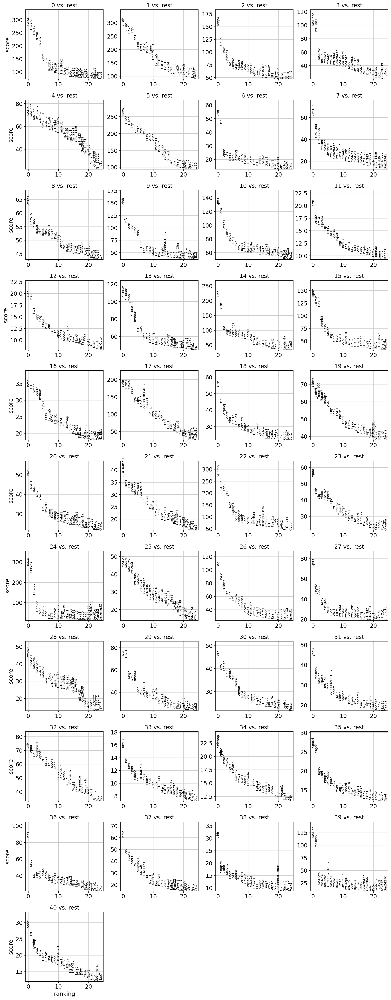

In [67]:
sc.tl.rank_genes_groups(adata_no_ERCC_3m, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata_no_ERCC_3m, n_genes=25, sharey=False)

In [68]:
adata_no_ERCC_3m.uns['rank_genes_groups']['names']

rec.array([('Cd74', 'C1qb', 'Fabp4', 'mt-Rnr2', 'mt-Co3', 'Hexb', 'Gsn', 'Gm10800', 'Eef1a1', 'Cd8b1', 'Gpx3', 'Krt8', 'Gsn', 'S100a9', 'Dcn', 'Ighm', 'Lyz2', 'Cela1', 'Gsn', 'Cldn5', 'Ly6c1', 'CT010467.1', 'S100a8', 'Apoe', 'Hba-a1', 'mt-Co1', 'Bsg', 'Gpx3', 'mt-Nd5', 'H2-K1', 'Perp', 'Lypd8', 'Alb', 'Krt18', 'Selenop', 'Sparcl1', 'Plp1', 'Inmt', 'Ckb', 'mt-Rnr1', 'Apoe'),
           ('H2-Ab1', 'C1qc', 'Cd36', 'mt-Rnr1', 'mt-Rnr2', 'C1qa', 'Dcn', 'Gm10801', 'Coro1a', 'Tcf7', 'Sdc4', 'Acta2', 'Ins2', 'S100a8', 'Gsn', 'Cd79b', 'Ftl1', 'Ctrb1', 'Dcn', 'Calcrl', 'H2-D1', 'Krt8', 'S100a9', 'Ckb', 'Hbb-bs', 'mt-Nd1', 'Ly6c1', 'Fxyd2', 'mt-Co1', 'H2-D1', 'Krt5', 'mt-Rnr2', 'Apoa1', 'Krt8', 'Aplp2', 'Mfge8', 'Mbp', 'Gsn', 'Snap25', 'mt-Rnr2', 'Ftl1'),
           ('H2-Aa', 'Hexb', 'Ly6c1', 'mt-Nd2', 'mt-Rnr1', 'C1qb', 'Apoe', 'Gm21738', 'Shisa5', 'Satb1', 'Eef1a1', 'Krt14', 'Ins1', 'Tyrobp', 'Dpt', 'Cd79a', 'Tyrobp', 'Cela2a', 'Serping1', 'Tmem100', 'Ifitm3', 'Krt18', 'Lcn2', 'Clu', 'Hba-a2', 

<AxesSubplot:xlabel='pct_counts_mt', ylabel='Count'>

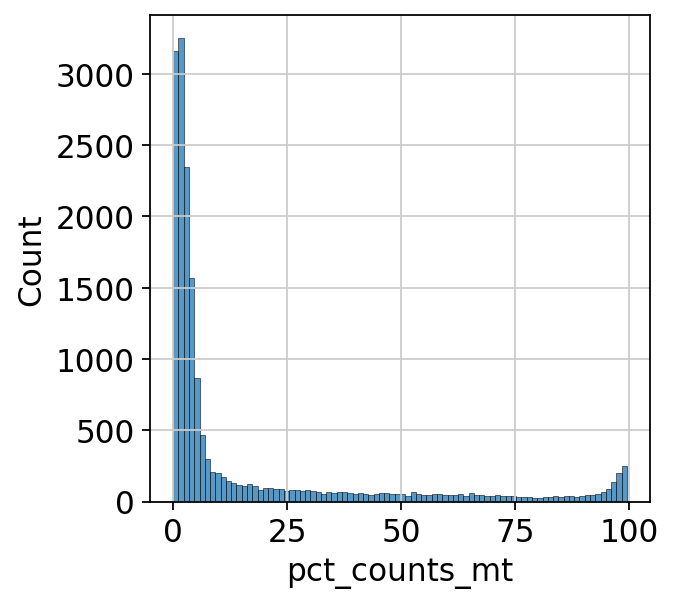

In [71]:
#sc.pp.calculate_qc_metrics(adata, qc_vars=([mt_genes]))

sns.histplot(adata_no_ERCC_3m.obs["pct_counts_mt"])

In [73]:
#adata_no_ERCC_3m.var["mito"] = adata_no_ERCC_3m.var_names.str.startswith("mt-")
#sc.pp.calculate_qc_metrics(adata_no_ERCC_3m, qc_vars=["mito"], inplace=True)
#sns.jointplot(
#    data=adata_no_ERCC_3m.obs,
#    x="log1p_total_counts",
#    y="log1p_n_genes_by_counts",
#    kind="hex",
#)

In [76]:
sc.settings.verbosity = 2  # reduce the verbosity, how much you want it to 'talk' to you

The result of a Wilcoxon rank-sum (Mann-Whitney-U) test is very similar. We recommend using the latter in publications, see e.g., Sonison & Robinson (2018). You might also consider much more powerful differential testing packages like MAST, limma, DESeq2 and, for python, the recent diffxpy.

ranking genes
    finished (0:01:06)


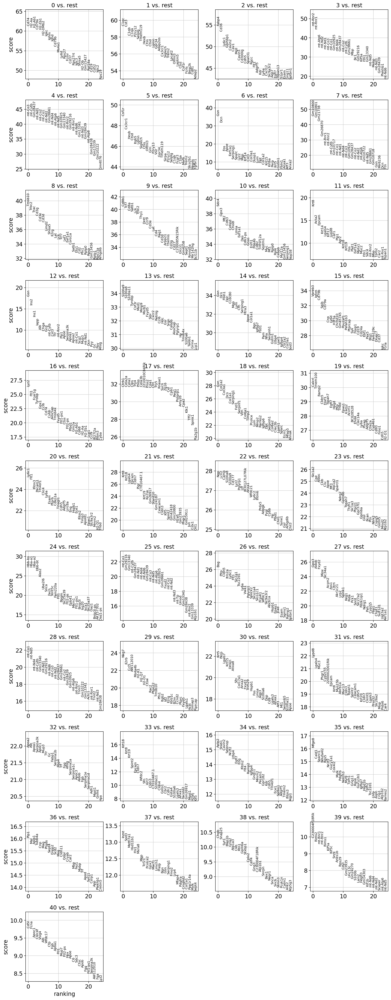

In [77]:
sc.tl.rank_genes_groups(adata_no_ERCC_3m, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata_no_ERCC_3m, n_genes=25, sharey=False)#already set to use .raw

In [78]:
adata_no_ERCC_3m.write(results_file_mito)

As an alternative, let us rank genes using logistic regression. For instance, this has been suggested by Natranos et al. (2018). The essential difference is that here, we use a multi-variate appraoch whereas conventional differential tests are uni-variate. Clark et al. (2014) has more details.

In [100]:
#Don't think I have to use this.
#sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)
adata_no_ERCC_3m
adata_no_ERCC_3m.obs['free_annotation']

index
A10.MAA000554.3_8_M.1.1-1-1-0-0-0                                   nan
A11.D041912.3_8_M.1.1-1-1-0-0-0                 granulocytopoietic cell
A12.MAA000554.3_8_M.1.1-1-1-0-0-0                                   nan
A13.D041912.3_8_M.1.1-1-1-0-0-0                             granulocyte
A15.D042193.3_8_M.1.1-1-1-0-0-0                            naïve B cell
                                                    ...                
P9.MAA000898.3_11_M.1.1-1-1-0-0-0    coronary vascular endothelial cell
P9.MAA000906.3_11_M.1.1-1-1-0-0-0                                   nan
P9.MAA001888.3_39_F.1.1-1-1-0-0-0                         BM CD4 T cell
P9.MAA001892.3_38_F.1.1-1-1-0-0-0                              Lympatic
P9.MAA001894.3_39_F.1.1-1-1-0-0-0                                   nan
Name: free_annotation, Length: 17456, dtype: category
Categories (93, object): ['Adventitial Fibroblast', 'Alveolar Epithelial Type 2', 'Alveolar Epithelial Type 2 Cell', 'Alveolar Fibroblast', ..., 'su

In [ ]:
marker_genes = ['Mrps34','Mterf4','Nsun4','Tymp']
#just used a couple mito-related genes used as marker genes in mito diseases

In [97]:
adata_no_ERCC_3m = sc.read(results_file_mito)

In [98]:
pd.DataFrame(adata_no_ERCC_3m.uns['rank_genes_groups']['names']).head(10)

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,40
0,Cd74,C1qc,Fabp4,mt-Rnr2,mt-Co3,Csf1r,Gsn,Gm10800,Tmsb10,Cd8b1,...,Lypd8,Apoa2,Krt18,Aplp2,Mfge8,Plp1,Inmt,Chgb,C230004F18Rik,Cd5l
1,H2-Aa,Cst3,Cd36,mt-Rnr1,mt-Cytb,Cx3cr1,Dcn,Gm10801,Trbc2,Tcf7,...,Lgals4,Alb,Krt8,Stab1,Cald1,Mal,Sod3,Snap25,Rims2,Fcna
2,H2-Ab1,C1qb,Ly6c1,mt-Atp6,Gm28437,Hexb,Fos,Gm21738,Trac,Cd8a,...,Muc3,Apoa1,Krt19,Cavin2,Sparcl1,Aplp1,Mettl7a1,Syt1,mt-Rnr1,Apoc1
3,Cd79a,C1qa,Gpihbp1,mt-Nd2,mt-Nd1,Ctsd,Apoe,Gm26870,Cd3g,Satb1,...,Phgr1,Serpina3k,Spint2,Selenop,Ndufa4l2,Tubb4a,Hsd11b1,Map1b,mt-Rnr2,Clec4f
4,H2-Eb1,P2ry12,Cavin2,mt-Nd1,mt-Co2,Itgb5,Eef1a1,mt-Rnr1,Cd3e,Lck,...,Cyp2c55,Apoc1,Epcam,Nr2f2,Rgs5,Cnp,Fhl1,Gria2,Rims1,Vsig4
5,H2-DMb2,Selplg,Cav1,mt-Co3,mt-Co1,Lgmn,Serping1,mt-Rnr2,Cd3d,Trbc2,...,2200002D01Rik,Mup3,Cldn7,Ltbp4,Nr2f2,Mag,Mxra8,Atp1a3,Kif5a,Alb
6,Igkc,Tmem119,Mgll,mt-Co1,mt-Nd2,Siglech,Sparc,mt-Cytb,Limd2,Thy1,...,Epcam,Ttr,Wfdc2,Egfl7,Gucy1a1,Ptgds,Mgp,Ckb,Kif5c,Wfdc17
7,Ighm,Hexb,Cavin1,Gm10925,Gm28661,Ctss,Lyz2,Gm10717,Shisa5,Dntt,...,Krt8,Gc,Sfn,Eng,Cox4i2,Sept4,Tcf21,Rtn1,Snrk,Cfp
8,Ighd,Ctss,Cd300lg,mt-Nd4,mt-Nd4,Olfml3,Mgp,mt-Co1,Il2rg,Ccr9,...,Myo15b,Fabp1,Krt7,Ifitm2,Mylk,Enpp2,Pcolce2,Gpm6a,Anks1b,Fgb
9,Cd79b,Ctsd,Cdh5,Gm28437,mt-Atp6,Grn,Krt14,mt-Nd1,Lat,Cd3e,...,Abcb1a,Serpina1b,Cldn3,Flt4,Pdgfrb,Scd2,Gpx3,Stxbp1,Rps29,Apoa1


In [130]:
result = adata_no_ERCC_3m.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(5)
#error, hmm when 'pvals' is in key in ['names', 'pvals']

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,36_n,36_p,37_n,37_p,38_n,38_p,39_n,39_p,40_n,40_p
0,Cd74,0.0,C1qc,0.0,Fabp4,0.0,mt-Rnr2,0.000000e+00,mt-Co3,0.0,...,Plp1,6.965665e-58,Inmt,2.072622e-39,Chgb,5.995694e-25,C230004F18Rik,2.573829e-23,Cd5l,1.319530e-22
1,H2-Aa,0.0,Cst3,0.0,Cd36,0.0,mt-Rnr1,0.000000e+00,mt-Cytb,0.0,...,Mal,3.301407e-56,Sod3,6.719862e-39,Snap25,9.377884e-25,Rims2,2.143768e-22,Fcna,1.491391e-22
2,H2-Ab1,0.0,C1qb,0.0,Ly6c1,0.0,mt-Atp6,4.077660e-270,Gm28437,0.0,...,Aplp1,4.736698e-56,Mettl7a1,9.223980e-38,Syt1,7.548363e-24,mt-Rnr1,8.866313e-22,Apoc1,1.704531e-21
3,Cd79a,0.0,C1qa,0.0,Gpihbp1,0.0,mt-Nd2,1.187688e-266,mt-Nd1,0.0,...,Tubb4a,9.621348e-56,Hsd11b1,2.508589e-37,Map1b,1.021604e-23,mt-Rnr2,1.044580e-21,Clec4f,2.550404e-21
4,H2-Eb1,0.0,P2ry12,0.0,Cavin2,0.0,mt-Nd1,4.059252e-257,mt-Co2,0.0,...,Cnp,4.800399e-55,Fhl1,7.953352e-37,Gria2,1.141924e-23,Rims1,3.861684e-21,Vsig4,3.030430e-21


ranking genes
    finished (0:00:07)


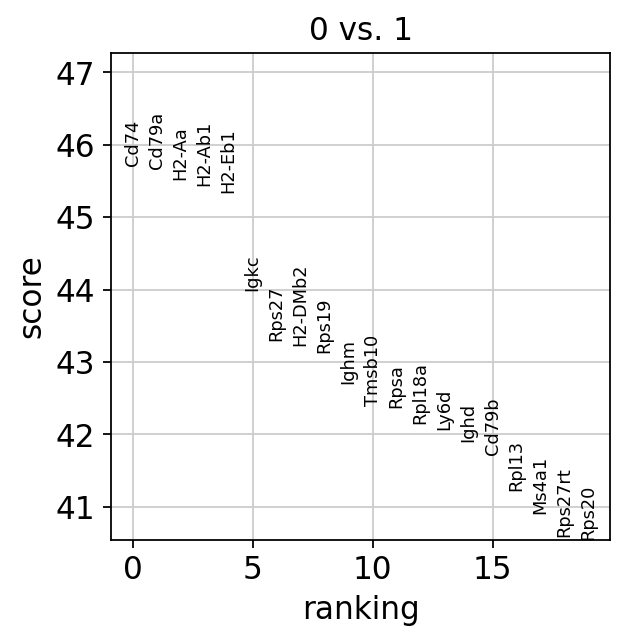

In [131]:
sc.tl.rank_genes_groups(adata_no_ERCC_3m, 'leiden', groups=['0'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(adata_no_ERCC_3m, groups=['0'], n_genes=20)

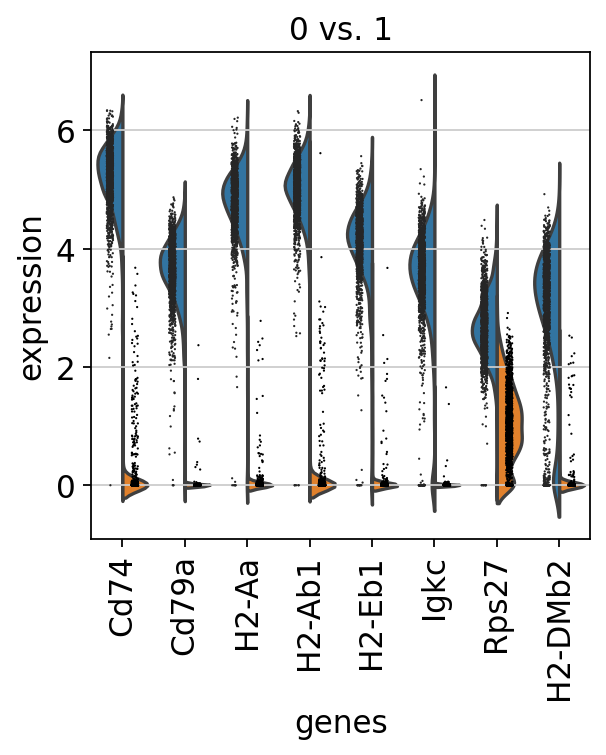

In [132]:
sc.pl.rank_genes_groups_violin(adata_no_ERCC_3m, groups='0', n_genes=8)

Reload the object with the computed differential expression (i.e. DE via a comparison with the rest of the groups):

In [133]:
adata_no_ERCC_3m = sc.read(results_file)

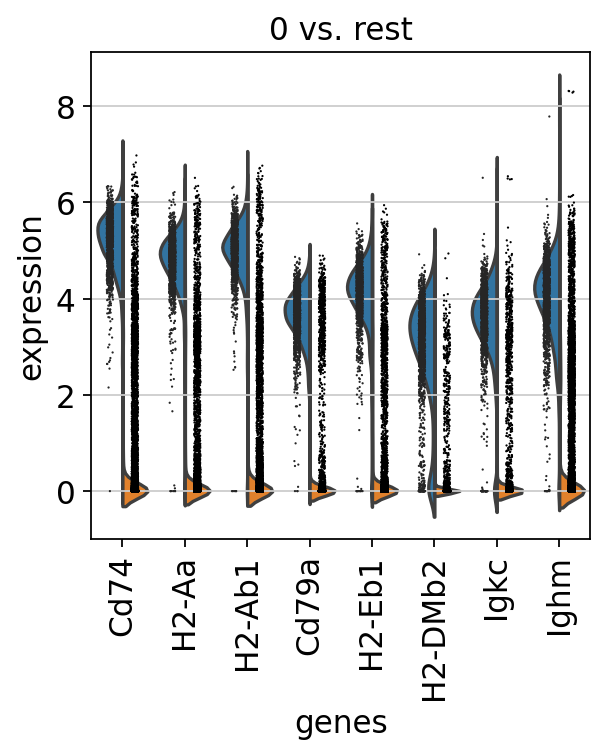

In [134]:
sc.pl.rank_genes_groups_violin(adata_no_ERCC_3m, groups='0', n_genes=8)

If you want to compare a certain gene across groups, use the following.

In [136]:
#sc.pl.violin(adata_no_ERCC_3m, ['mt-Co2', 'Mrps34', 'Tymp'], groupby='leiden')

Actually mark the cell types.

In [ ]:
#new_cluster_names = [
#    'CD4 T', 'CD14 Monocytes',
#    'B', 'CD8 T',
#    'NK', 'FCGR3A Monocytes',
#    'Dendritic', 'Megakaryocytes']
#adata.rename_categories('leiden', new_cluster_names)

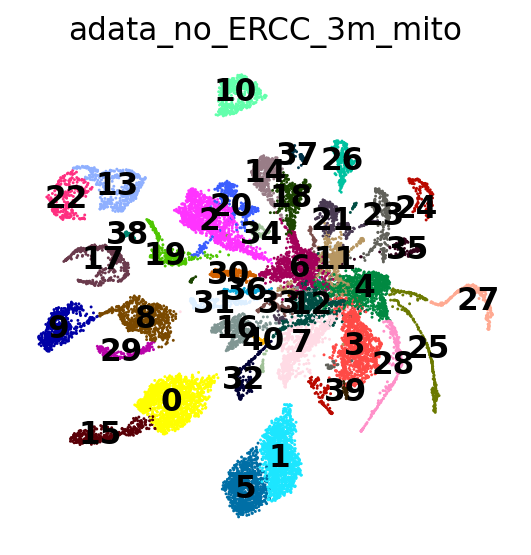

In [137]:
sc.pl.umap(adata_no_ERCC_3m, color='leiden', legend_loc='on data', title='adata_no_ERCC_3m_mito', frameon=False, save='.pdf')


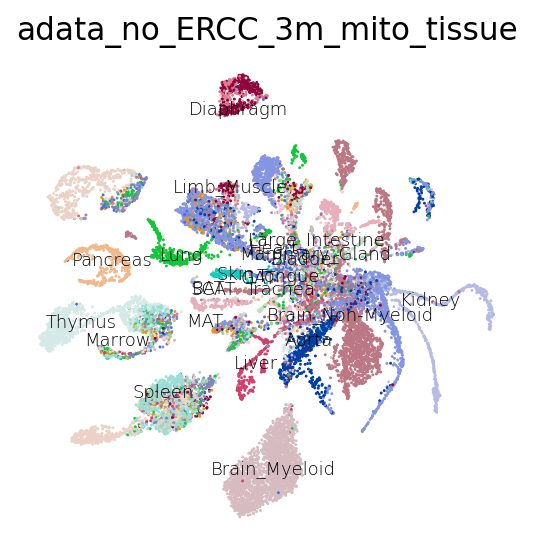

In [152]:
sc.pl.umap(adata_no_ERCC_3m, color='tissue', legend_fontweight = 'light', legend_fontsize= 'xx-small', legend_loc='on data', title='adata_no_ERCC_3m_mito_tissue', frameon=False, save='.pdf')


Now that we annotated the cell types, let us visualize the marker genes.

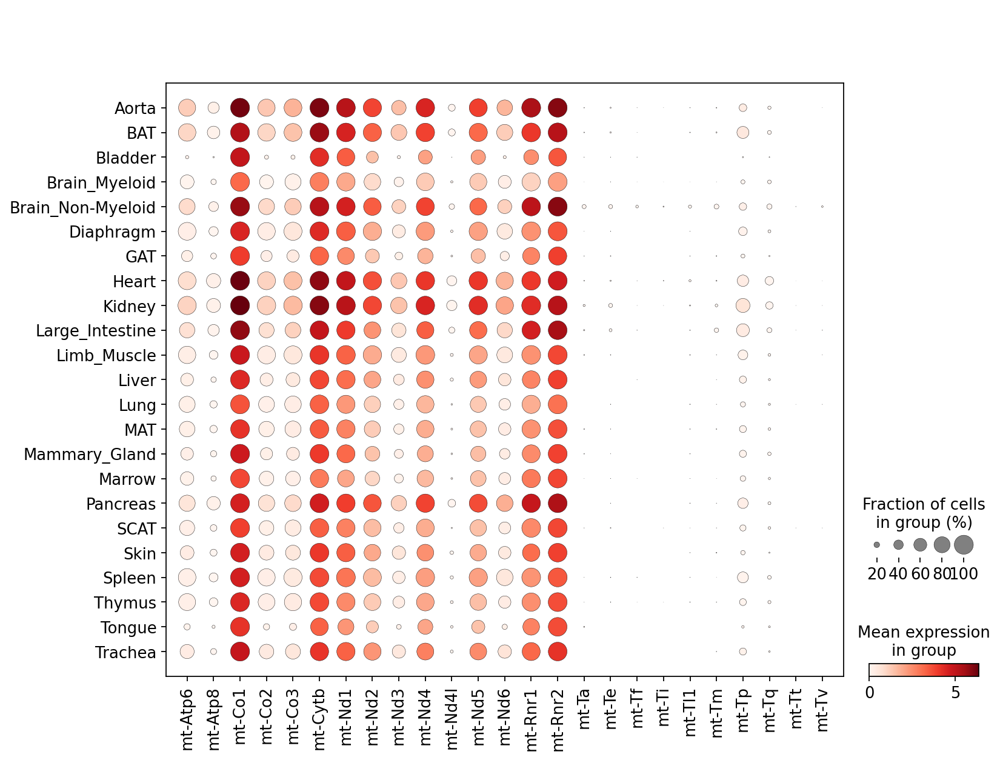

In [153]:
#sc.pl.dotplot(adata_no_ERCC_3m, mt_genes, groupby='leiden')
sc.pl.dotplot(adata_no_ERCC_3m, mt_genes, groupby='tissue')

There is also a very compact violin plot.

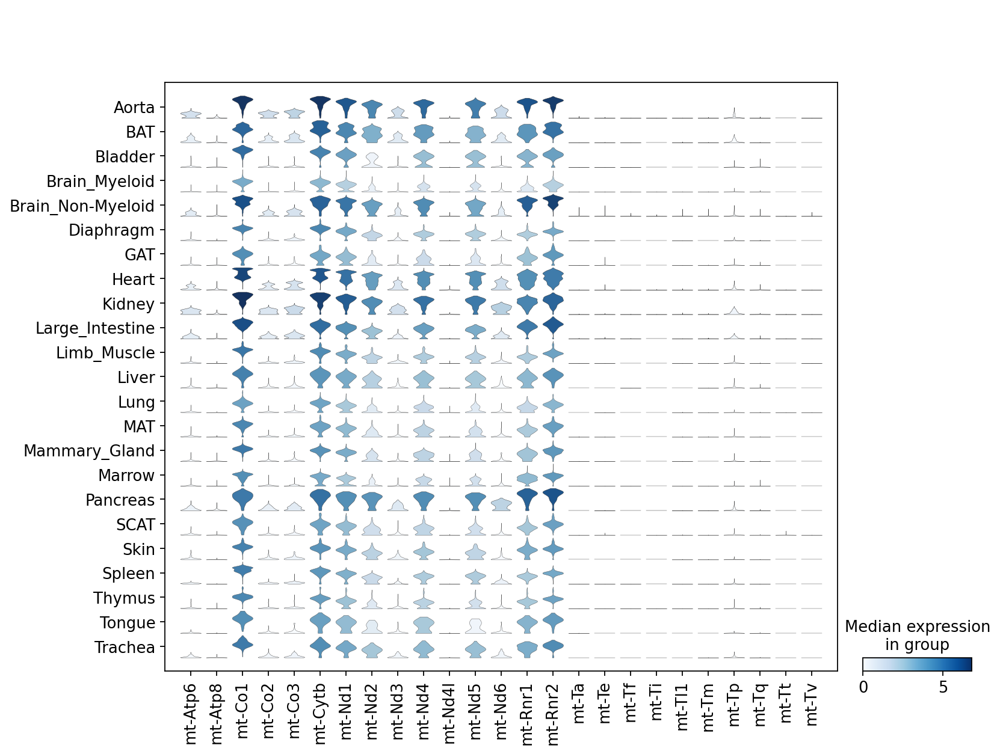

In [154]:
sc.pl.stacked_violin(adata_no_ERCC_3m, mt_genes, groupby='tissue', rotation=90);

In [156]:
adata_no_ERCC_3m.write(results_file_mito, compression='gzip')
# `compression='gzip'` saves disk space, but slows down writing and subsequent reading

In [157]:
canifile = sc.read_h5ad("/mnt/ibm_sm/home/lea.mcgeever/ms/notebooks/tms_mito.h5ad")

AnnData object with n_obs × n_vars = 17456 × 54352
    obs: 'FACS.selection', 'age', 'cell', 'cell_matching', 'cell_ontology_class', 'cell_ontology_id', 'free_annotation', 'gencode_index', 'method', 'mouse.id', 'newcellnames', 'sex', 'subtissue', 'tissue', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std', 'mito', 'log1p_mean_counts', 'log1p_total_counts'
    uns: 'dendrogram_leiden', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'rank_genes_groups', 'tissue_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connect